# Evaluate Unit-wget model over MPI and Era

This notebook evaluates different CNN autoencoder models on things like 1) monthly averages and 2) climate. The selected model tries to bias correct Mpi to Era and Era to MPI.

### TOC
 [1. Local Scale](#ls)<br>
 [2. Global Scale](#gs)<br>
 
 





### Buble plots for ALL storm days

In [110]:
def bubble_plot(top15_filters_era, err1_list_era):
    # Plot
    ffii = 0
    for ff in top15_filters_era[0:15]:
        ffii += 1
        sizes = []
        for vv in range(18):
            xx = list(err1_list_era[ff])
            fvar = xx[1][vv]
            sizes.append(fvar*5000)
        plt.scatter([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18],np.ones((18))*(16-ffii), s=sizes)
    plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18], ['U8', 'V8', 'Q8', 'T7', 'Z7', 'Z5', 'U2', 'V2', 'pr', 'tx', 'tn', 'u', 'v', 'h', 'rs', 'or', 'ms', 'yd'])
    plt.yticks([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15], ['15', '14', '13', '12', '11', '10', '9', '8', '7', '6', '5', '4', '3', '2', '1'])
    plt.legend([str(x) for x in top15_filters_era], bbox_to_anchor=(1.0, 1.05), title='Filter:')
    plt.show()
    

In [146]:
def plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen):
    # front_encoded
    encoded_extreme = gen.encode(input_chunk)[0].detach()

    # diff
    diff = encoded_extreme - bn_mean_era
    print(diff.shape)
    
    fig, axarr = plt.subplots(1, 15, figsize = (20,20))
    #fig, axarr = plt.subplots(1, 15, figsize = (20,20), subplot_kw={'projection': ccrs.PlateCarree()})
    #lon = dv1[0].lon
    #lat = dv1[0].lat

    for ii in range(15):
        #axarr[ii].coastlines()
        #axarr[ii].add_feature(cfeature.STATES)
        #img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
        
        plot = axarr[ii].imshow(diff[0,top15_filters_era[ii]].numpy()[:,::-1])
        axarr[ii].axis('off')
        axarr[ii].title.set_text(top15_filters_era[ii])
    plt.show()


torch.Size([1, 512, 8, 8])


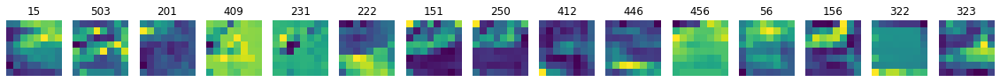

In [147]:
plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)

In [167]:
def show_storm(ii):
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]

    # denorm
    input_img_denorm = input_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    raw_era = np.array(input_img_denorm)[0]
    raw_era[np.isnan(raw_era)] = 0.   # extended surface domain has nan's at bottom
    #raw_era[8:] = (raw_era * mask)[8:]

    # ^4 prec
    raw_era[8] = raw_era[8] ** 4

    vmin = [raw_era[ii].min() for ii in range(18)]
    vmax = [raw_era[ii].max() for ii in range(18)]

    svars = [0,1,2,3,4,5,6,7,17]
    plot_9v_192x256_abs(raw_era, None, vmin, vmax, svars=svars, xoff=20, yoff=58)
    svars = [8,9,10,11,12,13,14,15,16]
    plot_9v_192x256_abs(raw_era, None, vmin, vmax, svars=svars, xoff=20, yoff=58)


<a id='ls'></a>
#### Local scale (autoscale per storm)

In [169]:
# RUN ONCE: cumulative filter counts (over all storm days)
cfc_era = {k: 0 for k in range(512)}

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


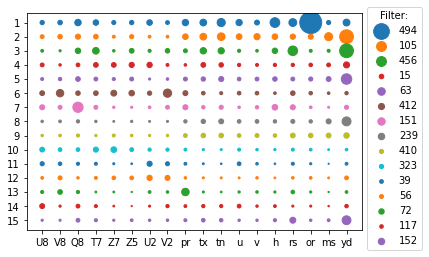

torch.Size([1, 512, 8, 8])


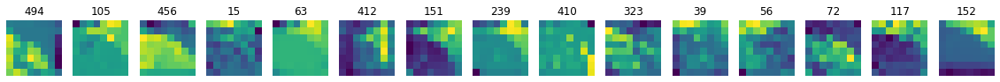

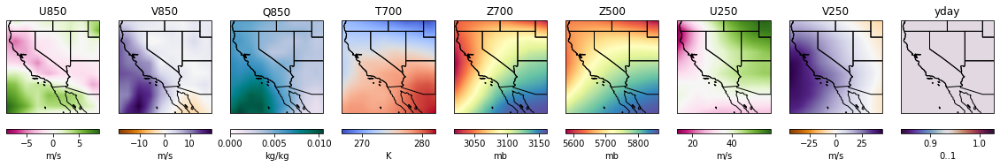

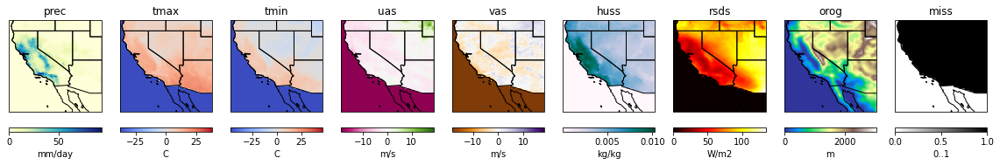

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


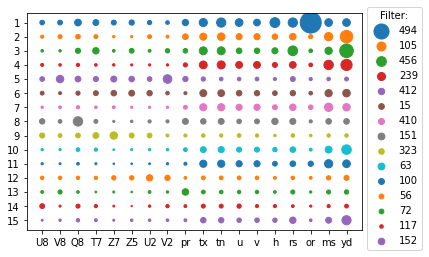

torch.Size([1, 512, 8, 8])


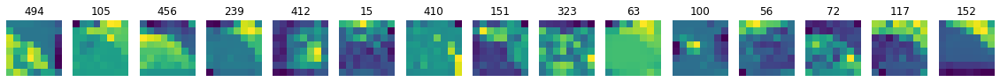

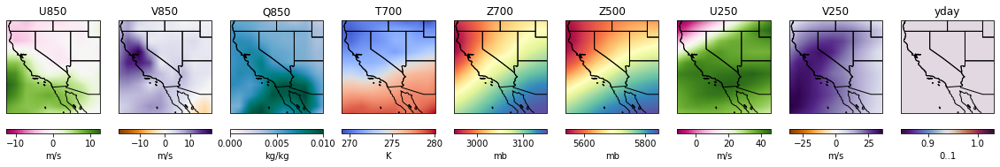

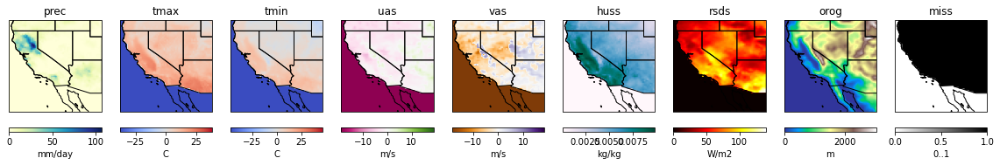

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


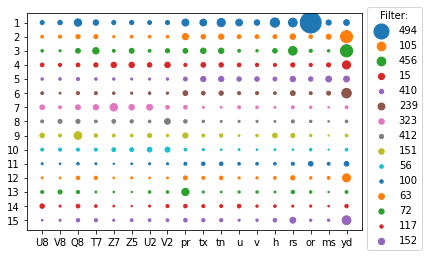

torch.Size([1, 512, 8, 8])


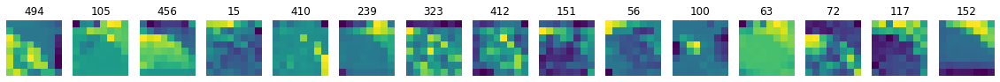

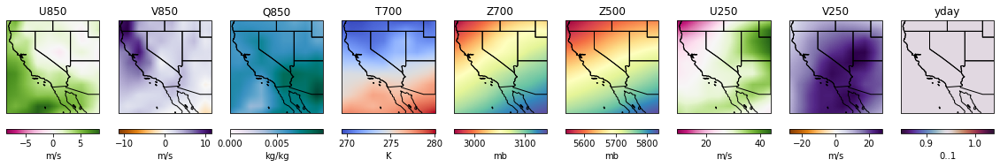

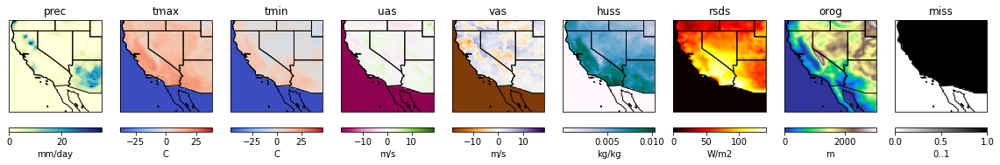

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


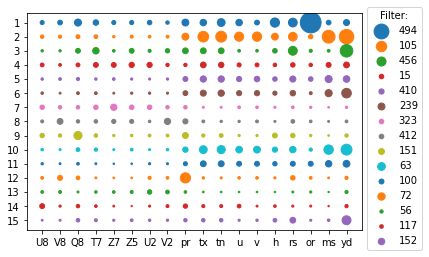

torch.Size([1, 512, 8, 8])


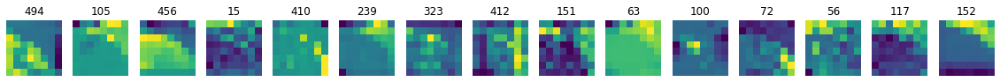

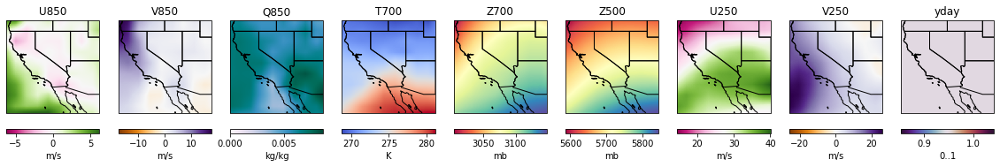

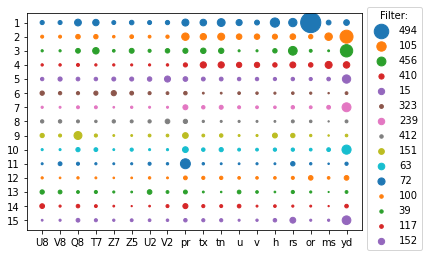

torch.Size([1, 512, 8, 8])


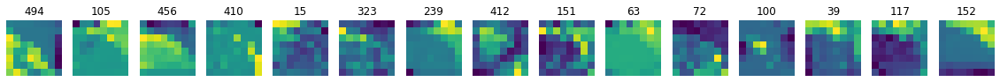

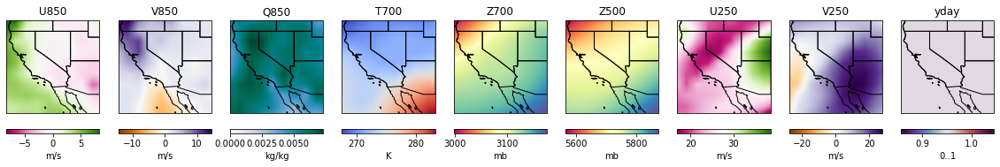

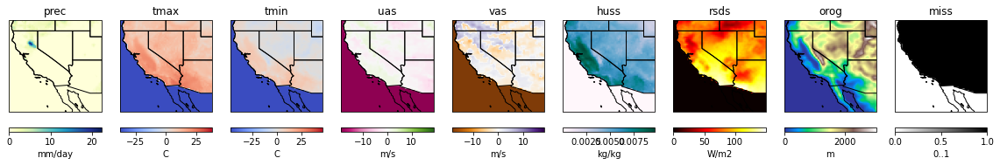

In [170]:
# storm indices: 0, 1, 2, 3, 4 
# storm1a (2014 December 2–6, 2014 (storm 1a) )
for ii in range(0,4+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]

    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    # accumulate filter counts from multiple storm days
    filtercounts_era = get_filtercounts(err1_list_era)
    # acumulate filtercounts over multiple days
    cfc_era = {k: cfc_era[k]+filtercounts_era[k] for k in range(512)}
    top15_filters_era = sorted(cfc_era, key=lambda x: cfc_era[x], reverse=True)[0:15]
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)



/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


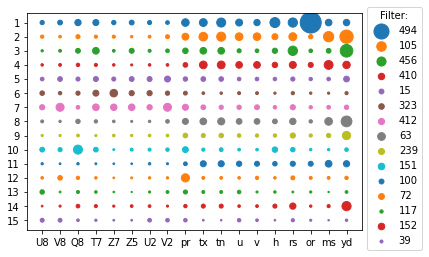

torch.Size([1, 512, 8, 8])


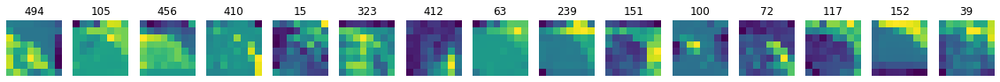

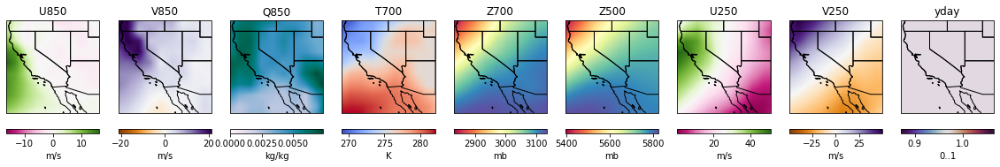

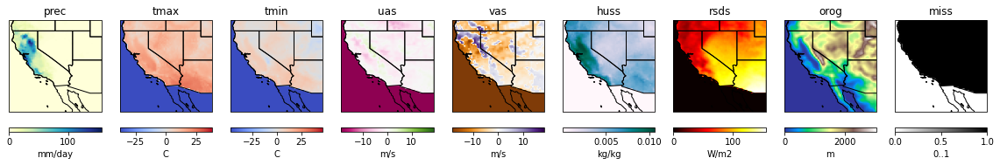

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


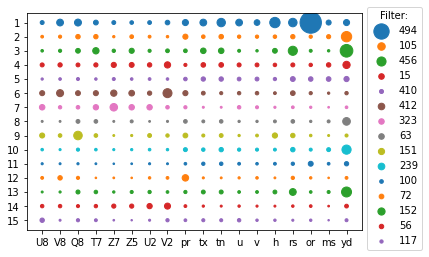

torch.Size([1, 512, 8, 8])


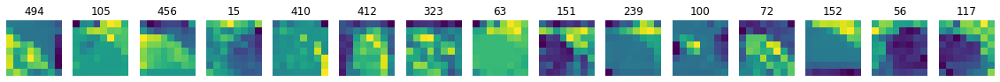

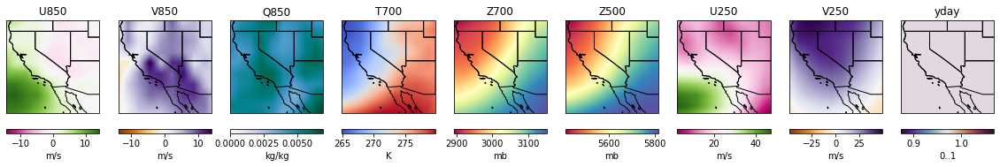

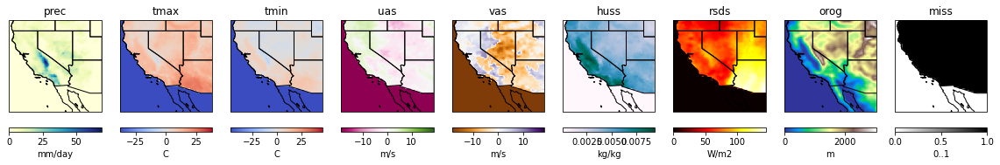

In [171]:
# storms indices: 5, 6
# storm1b (2014 December 11–12(storm 1b)
for ii in range(5,6+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    # accumulate filter counts from multiple storm days
    filtercounts_era = get_filtercounts(err1_list_era)
    # acumulate filtercounts over multiple days
    cfc_era = {k: cfc_era[k]+filtercounts_era[k] for k in range(512)}
    top15_filters_era = sorted(cfc_era, key=lambda x: cfc_era[x], reverse=True)[0:15]
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


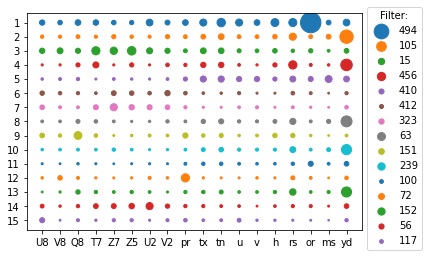

torch.Size([1, 512, 8, 8])


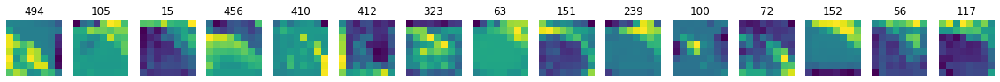

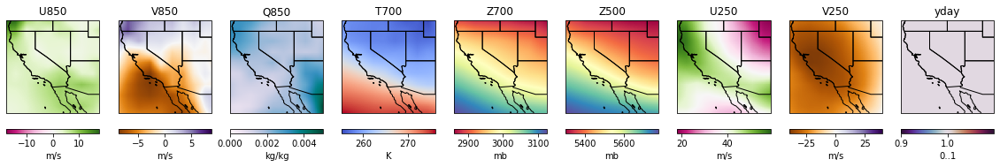

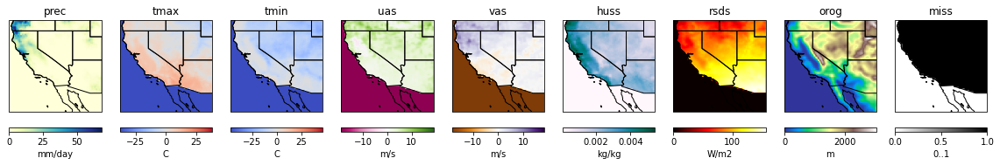

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


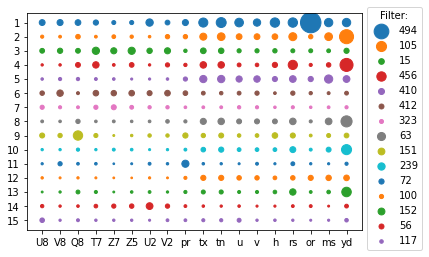

torch.Size([1, 512, 8, 8])


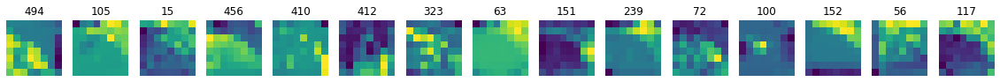

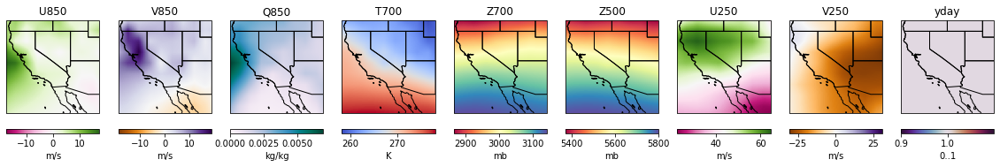

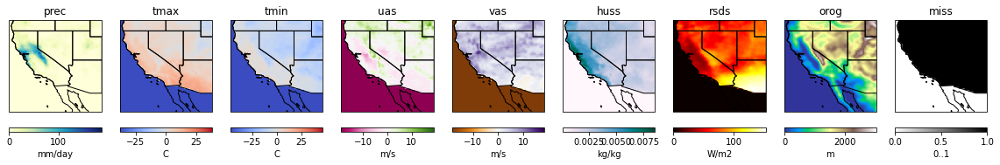

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


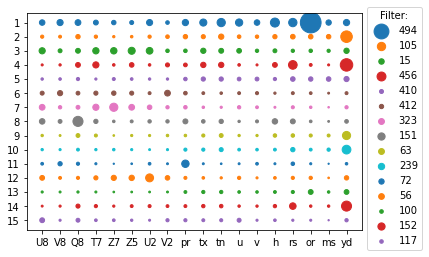

torch.Size([1, 512, 8, 8])


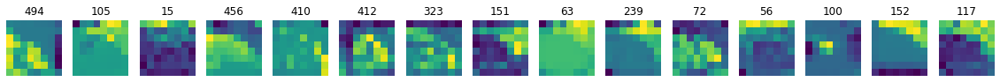

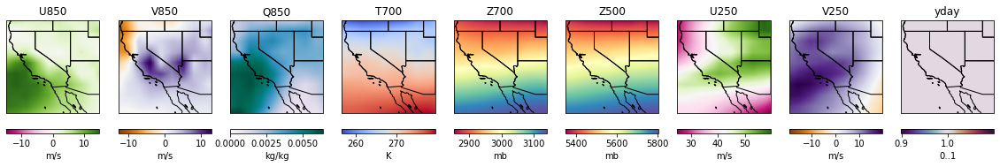

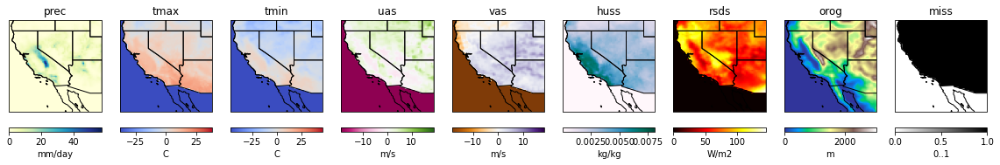

In [172]:
# storms indices: 7, 8, 9
# storm2 (January 3–5, 1982)
for ii in range(7,9+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    # accumulate filter counts from multiple storm days
    filtercounts_era = get_filtercounts(err1_list_era)
    # acumulate filtercounts over multiple days
    cfc_era = {k: cfc_era[k]+filtercounts_era[k] for k in range(512)}
    top15_filters_era = sorted(cfc_era, key=lambda x: cfc_era[x], reverse=True)[0:15]
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


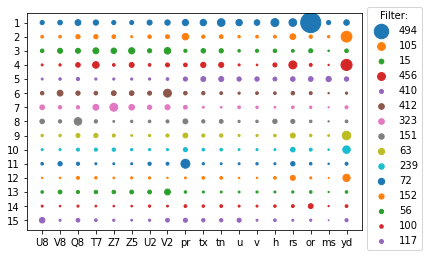

torch.Size([1, 512, 8, 8])


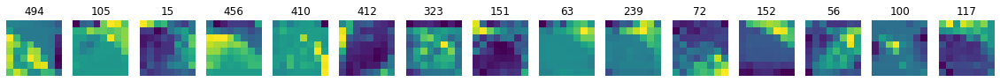

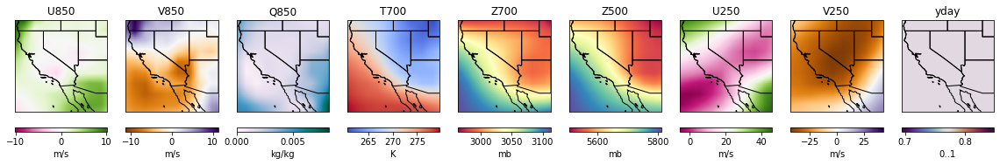

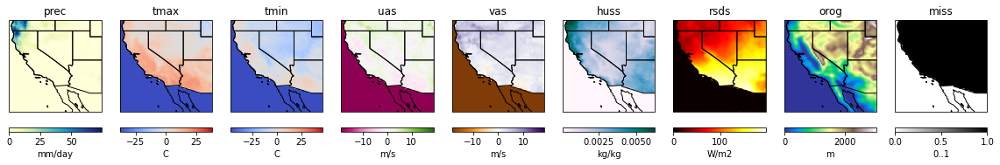

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


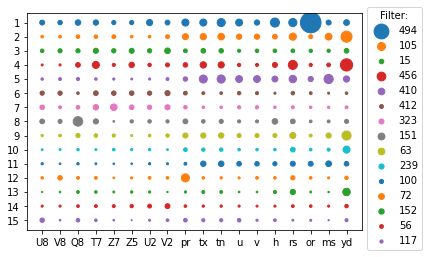

torch.Size([1, 512, 8, 8])


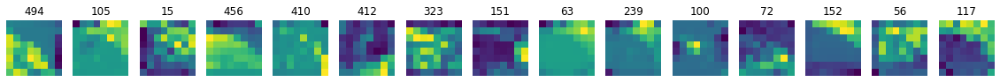

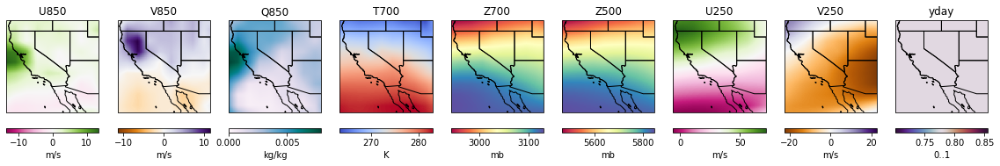

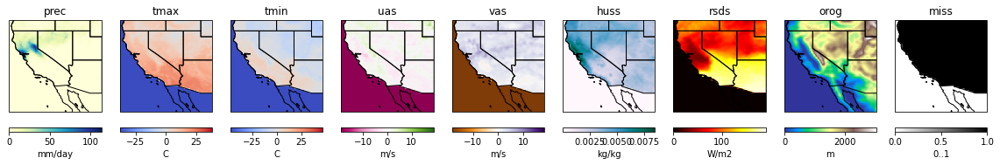

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


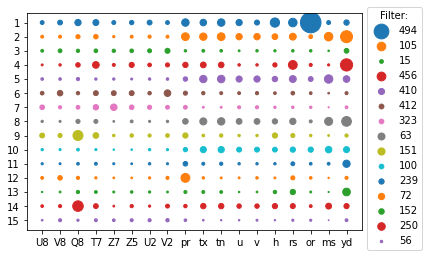

torch.Size([1, 512, 8, 8])


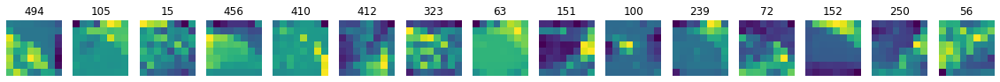

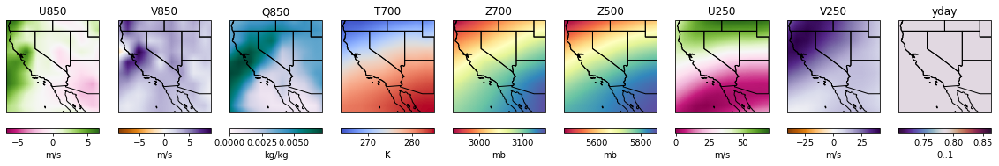

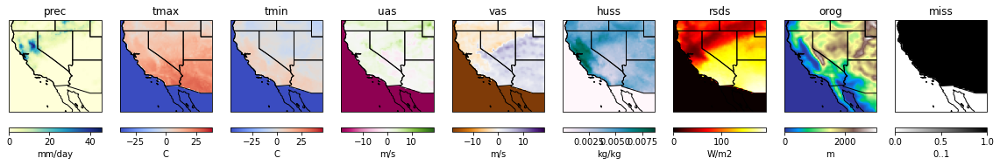

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


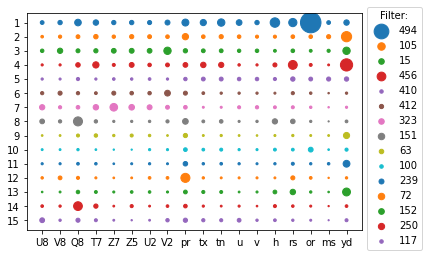

torch.Size([1, 512, 8, 8])


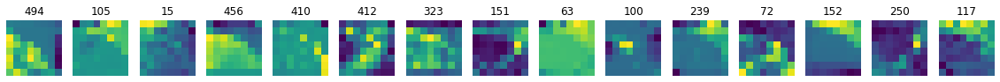

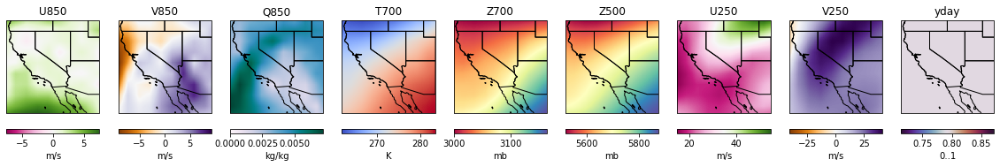

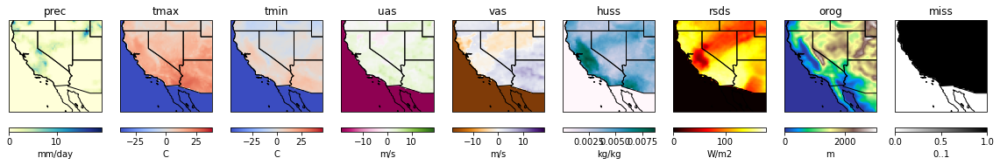

In [173]:
# storms indices: 10, 11, 12, 13
# storm3 (November 4–7, 1994)
for ii in range(10,13+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    # accumulate filter counts from multiple storm days
    filtercounts_era = get_filtercounts(err1_list_era)
    # acumulate filtercounts over multiple days
    cfc_era = {k: cfc_era[k]+filtercounts_era[k] for k in range(512)}
    top15_filters_era = sorted(cfc_era, key=lambda x: cfc_era[x], reverse=True)[0:15]
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


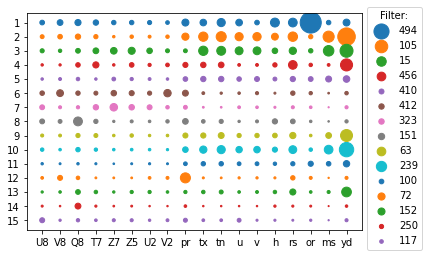

torch.Size([1, 512, 8, 8])


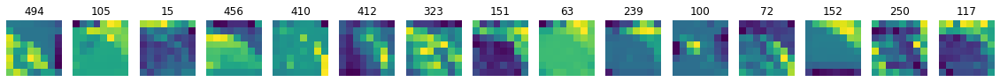

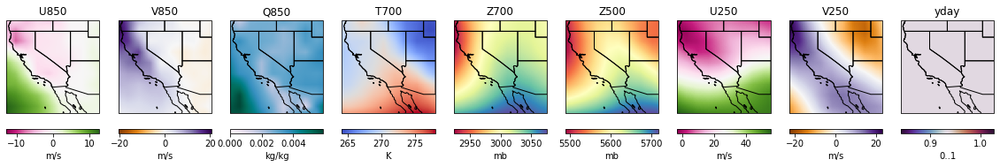

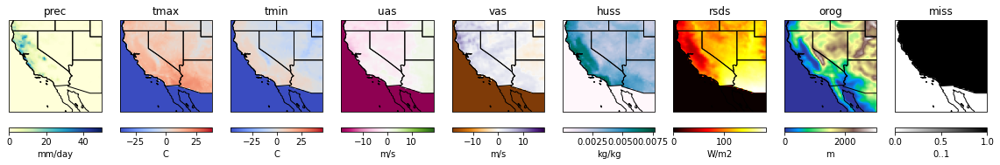

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


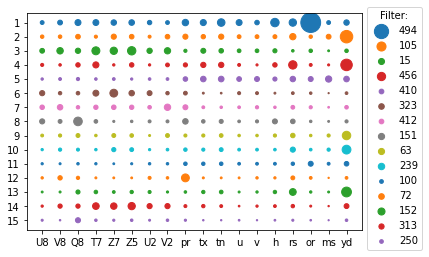

torch.Size([1, 512, 8, 8])


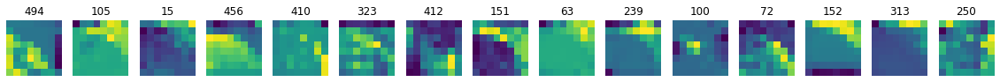

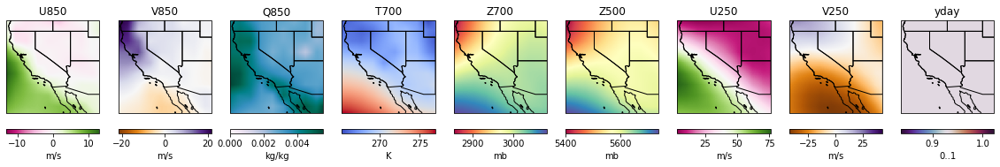

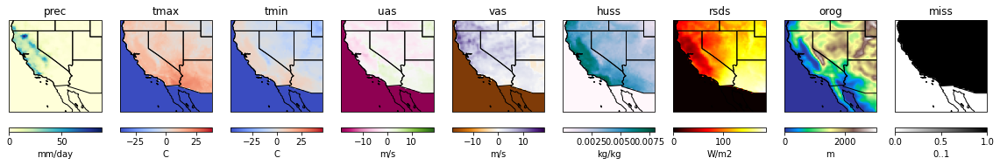

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


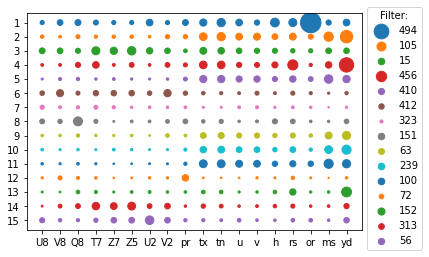

torch.Size([1, 512, 8, 8])


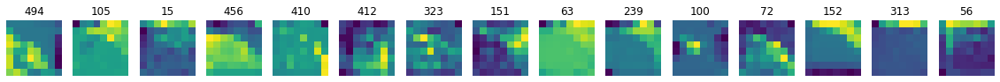

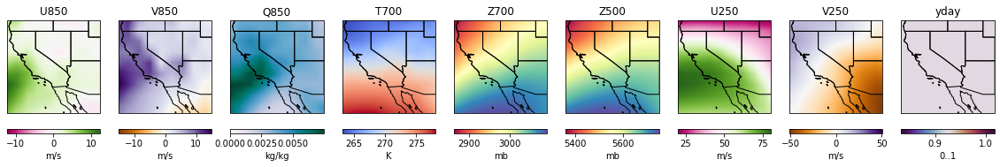

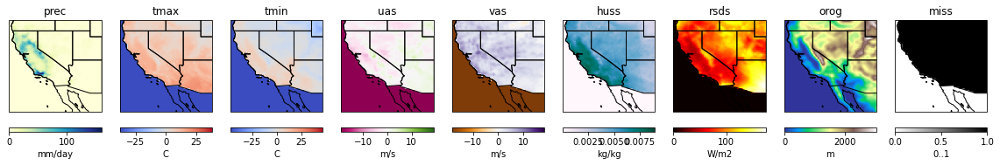

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


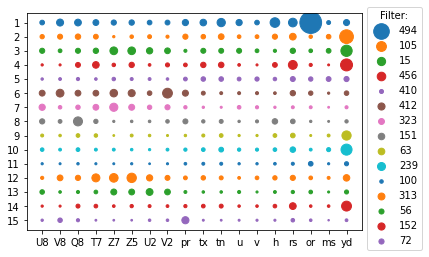

torch.Size([1, 512, 8, 8])


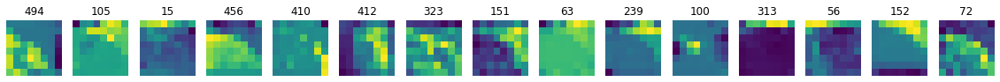

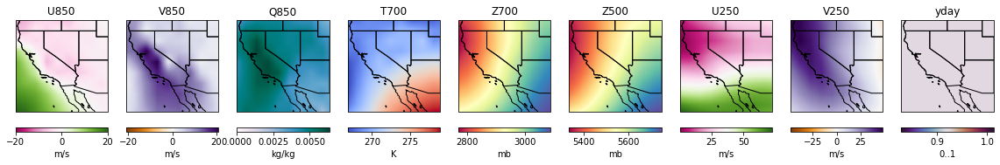

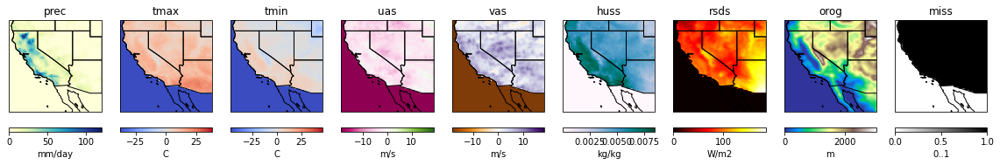

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


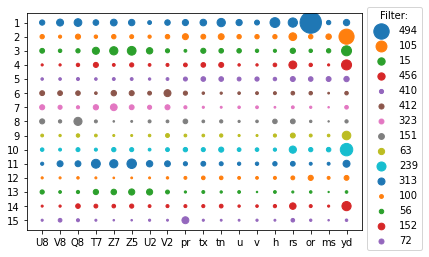

torch.Size([1, 512, 8, 8])


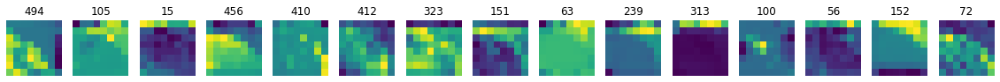

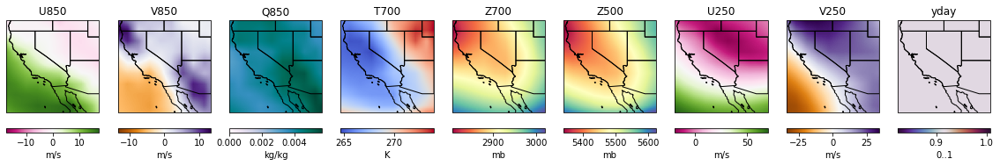

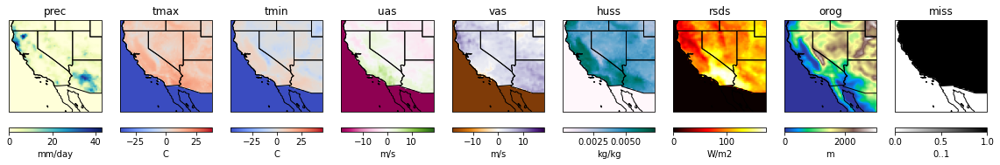

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


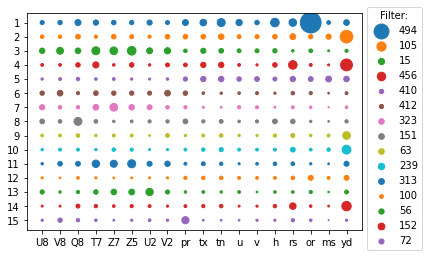

torch.Size([1, 512, 8, 8])


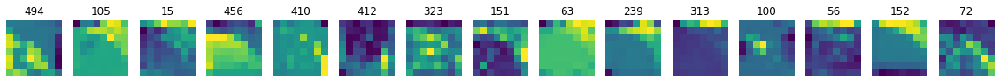

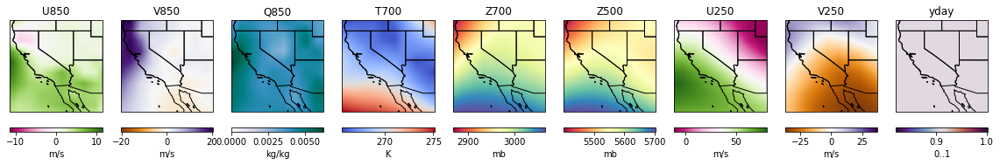

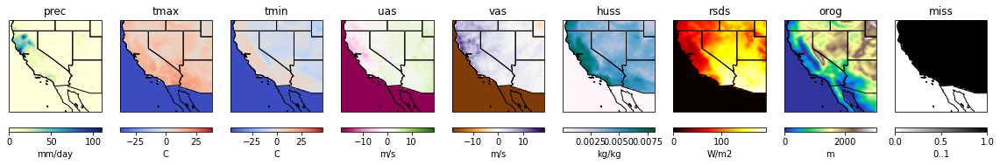

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


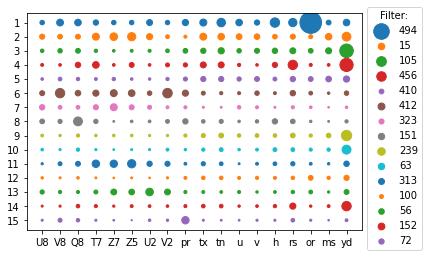

torch.Size([1, 512, 8, 8])


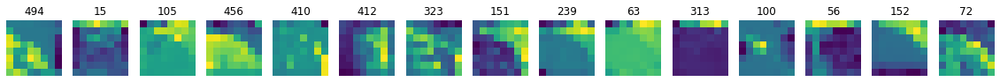

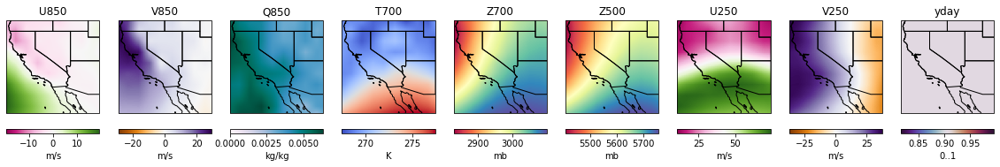

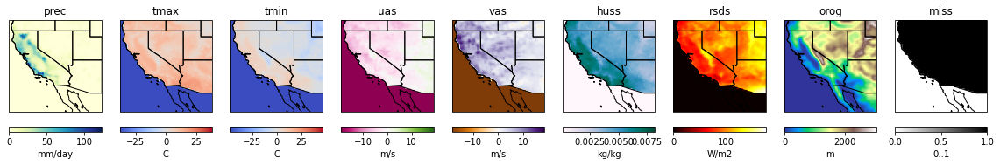

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


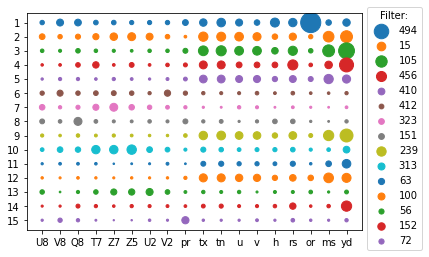

torch.Size([1, 512, 8, 8])


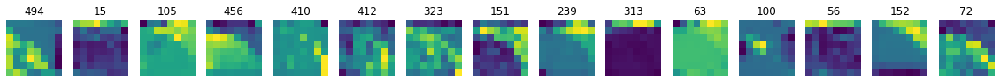

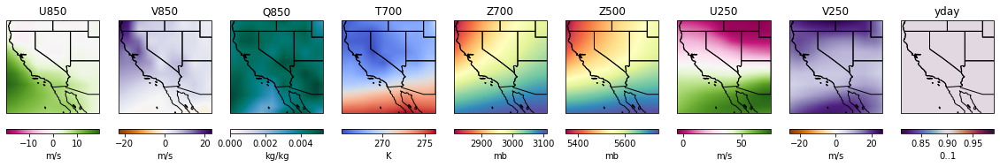

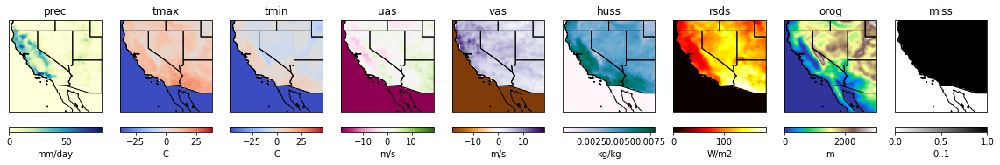

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


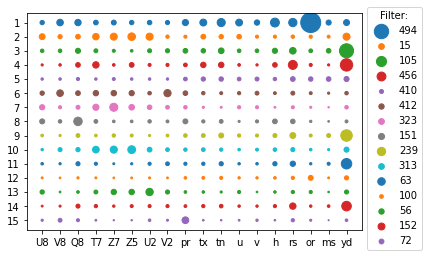

torch.Size([1, 512, 8, 8])


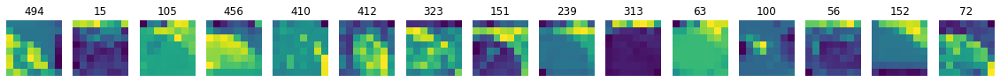

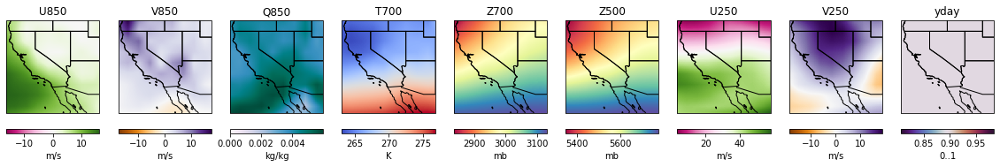

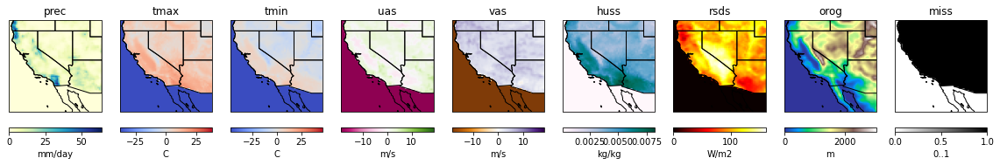

In [174]:
# storms indices: 14, 15, 16, 17, 18, 19, 20, 21, 22
# storm4 (January 31 - February 8, 1998)
for ii in range(14,22+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    # accumulate filter counts from multiple storm days
    filtercounts_era = get_filtercounts(err1_list_era)
    # acumulate filtercounts over multiple days
    cfc_era = {k: cfc_era[k]+filtercounts_era[k] for k in range(512)}
    top15_filters_era = sorted(cfc_era, key=lambda x: cfc_era[x], reverse=True)[0:15]
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


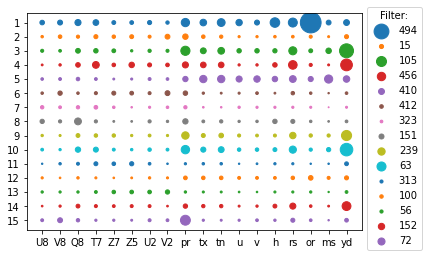

torch.Size([1, 512, 8, 8])


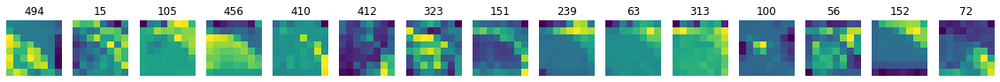

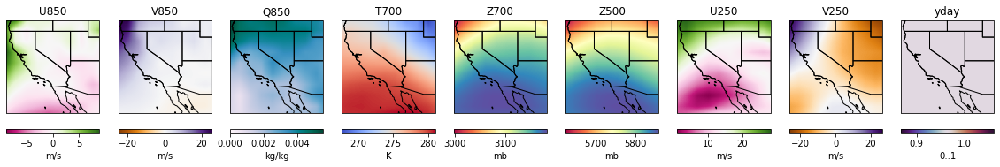

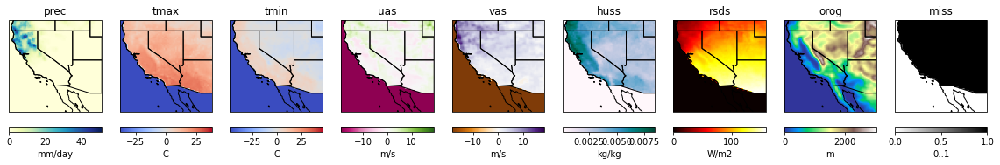

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


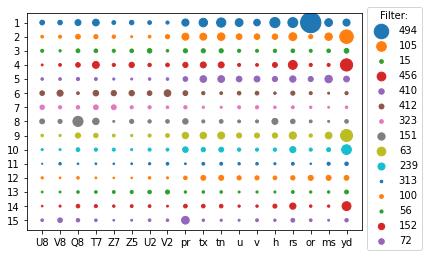

torch.Size([1, 512, 8, 8])


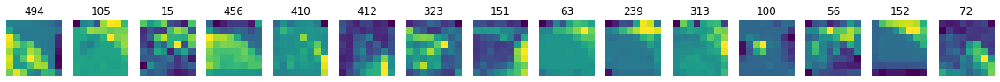

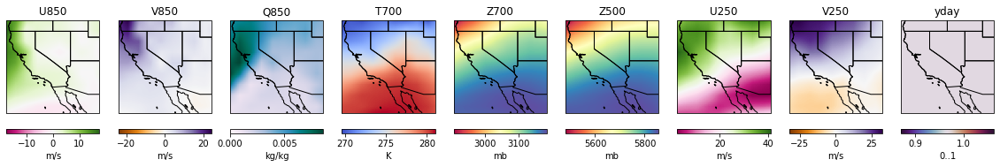

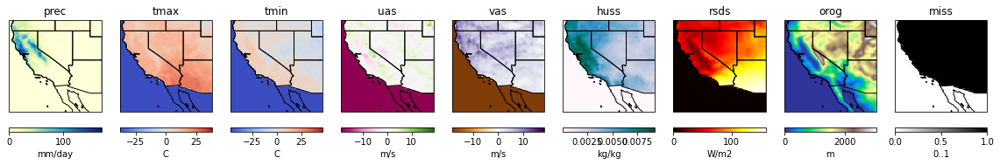

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys


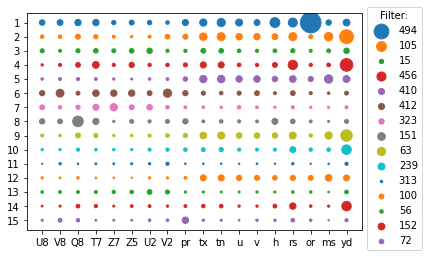

torch.Size([1, 512, 8, 8])


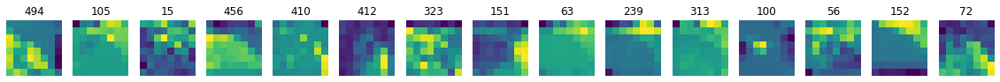

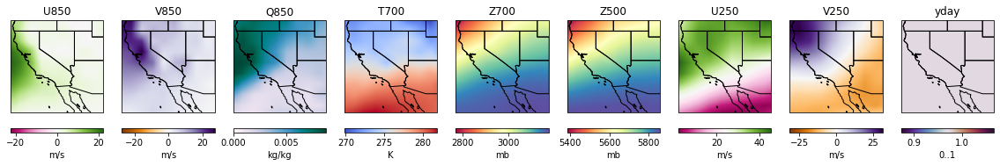

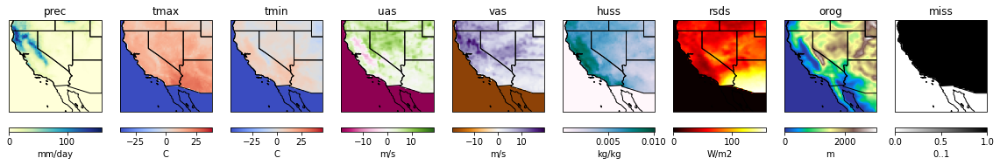

In [175]:
# storms indices: 23, 24, 25
# storm5 (December 10–13, 1995)
for ii in range(23,25+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    # accumulate filter counts from multiple storm days
    filtercounts_era = get_filtercounts(err1_list_era)
    # acumulate filtercounts over multiple days
    cfc_era = {k: cfc_era[k]+filtercounts_era[k] for k in range(512)}
    top15_filters_era = sorted(cfc_era, key=lambda x: cfc_era[x], reverse=True)[0:15]
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


In [176]:
print(dict(sorted(cfc_era.items(), key=lambda x: x[1], reverse=True)))


{494: 355, 105: 222, 15: 208, 456: 165, 410: 164, 412: 126, 323: 98, 151: 91, 63: 82, 239: 70, 313: 66, 100: 54, 56: 47, 152: 42, 72: 39, 250: 38, 222: 29, 156: 28, 117: 27, 446: 27, 322: 26, 505: 26, 254: 25, 415: 25, 6: 23, 310: 23, 331: 22, 308: 20, 171: 16, 39: 15, 459: 13, 261: 11, 364: 10, 376: 10, 438: 10, 346: 9, 497: 9, 503: 9, 176: 7, 355: 7, 154: 6, 201: 6, 325: 6, 33: 5, 20: 4, 36: 3, 114: 3, 225: 3, 77: 2, 196: 2, 51: 1, 73: 1, 78: 1, 129: 1, 409: 1, 427: 1, 0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 16: 0, 17: 0, 18: 0, 19: 0, 21: 0, 22: 0, 23: 0, 24: 0, 25: 0, 26: 0, 27: 0, 28: 0, 29: 0, 30: 0, 31: 0, 32: 0, 34: 0, 35: 0, 37: 0, 38: 0, 40: 0, 41: 0, 42: 0, 43: 0, 44: 0, 45: 0, 46: 0, 47: 0, 48: 0, 49: 0, 50: 0, 52: 0, 53: 0, 54: 0, 55: 0, 57: 0, 58: 0, 59: 0, 60: 0, 61: 0, 62: 0, 64: 0, 65: 0, 66: 0, 67: 0, 68: 0, 69: 0, 70: 0, 71: 0, 74: 0, 75: 0, 76: 0, 79: 0, 80: 0, 81: 0, 82: 0, 83: 0, 84: 0, 85: 0, 86: 0, 87: 0, 88: 0, 8

<a id='gs'></a>
#### Global scale (over all storms)

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


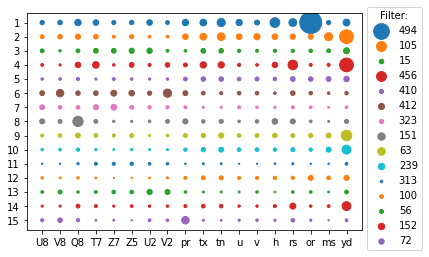

torch.Size([1, 512, 8, 8])


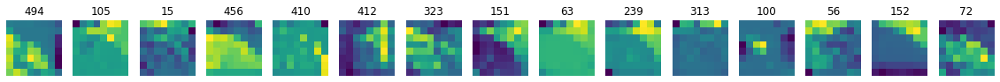

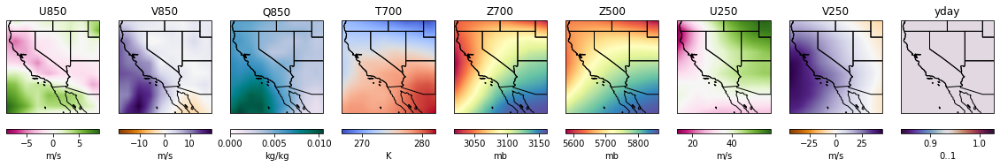

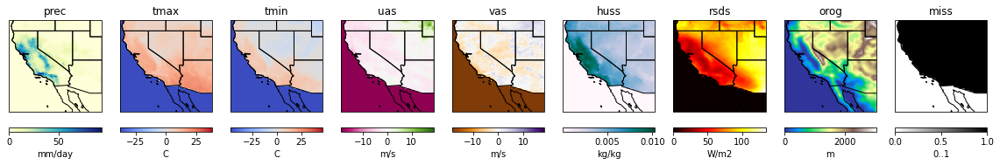

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


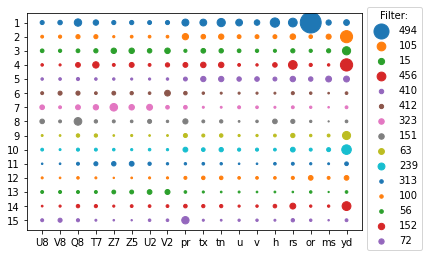

torch.Size([1, 512, 8, 8])


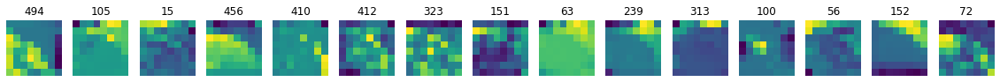

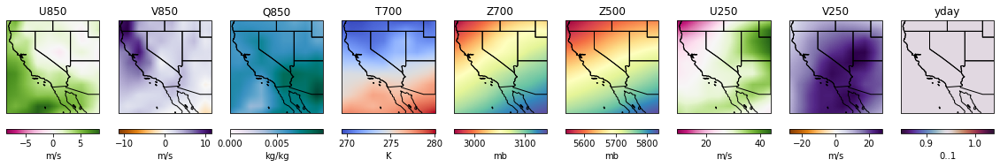

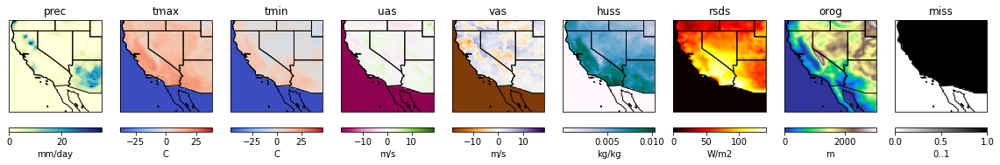

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


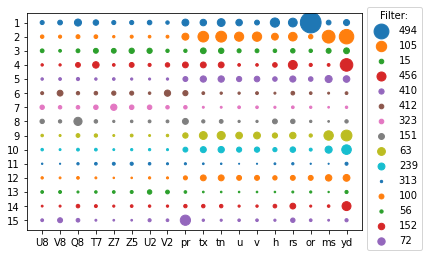

torch.Size([1, 512, 8, 8])


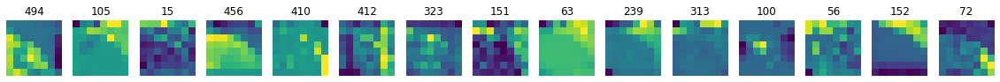

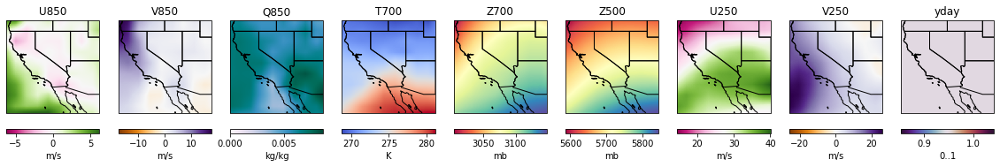

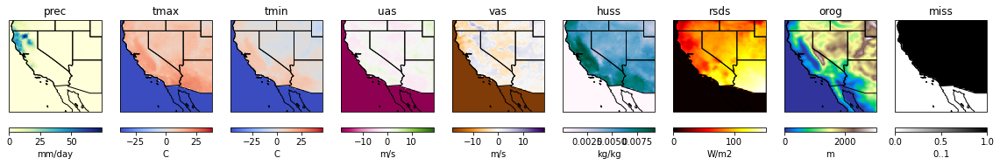

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


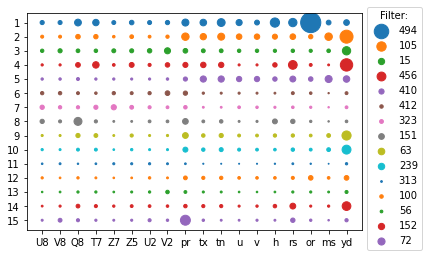

torch.Size([1, 512, 8, 8])


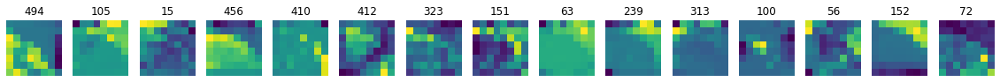

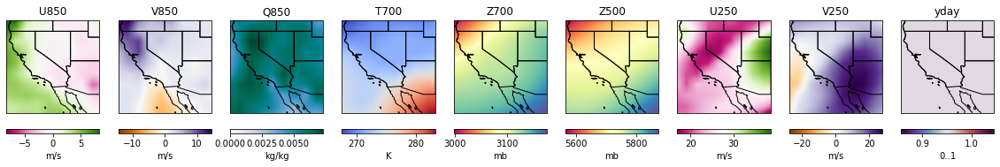

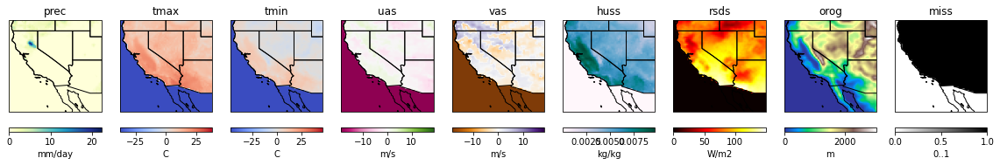

In [177]:
# storm indices: 0, 1, 2, 3, 4 
# storm1a (2014 December 2–6, 2014 (storm 1a) )
for ii in range(0,4+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]

    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


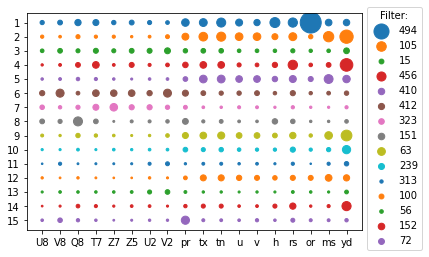

torch.Size([1, 512, 8, 8])


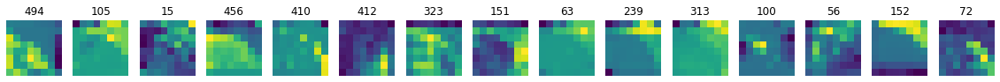

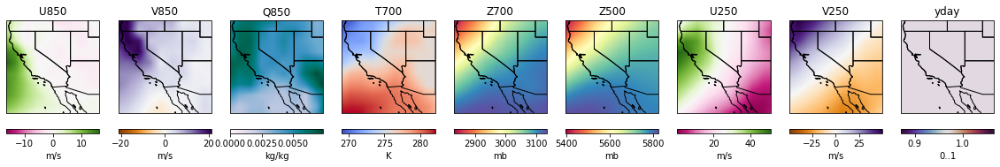

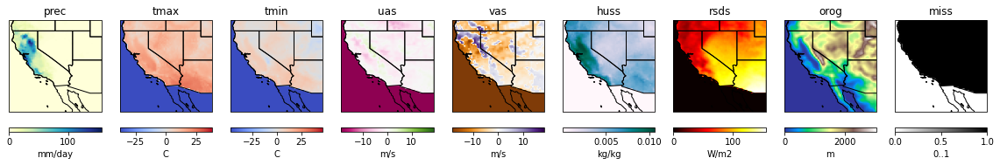

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


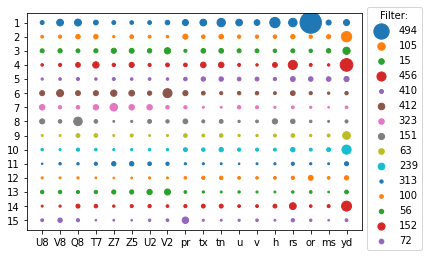

torch.Size([1, 512, 8, 8])


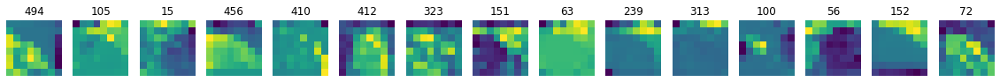

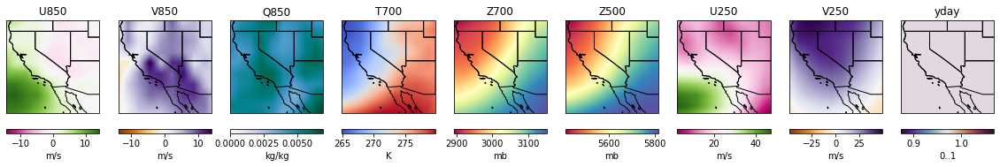

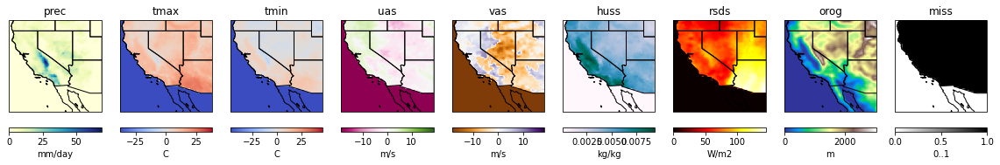

In [178]:
# storms indices: 5, 6
# storm1b (2014 December 11–12(storm 1b)
for ii in range(5,6+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
        
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


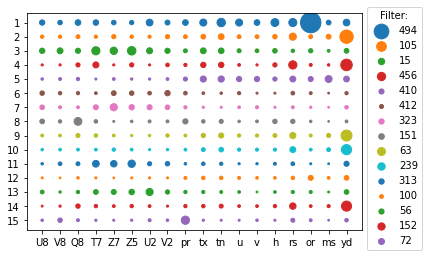

torch.Size([1, 512, 8, 8])


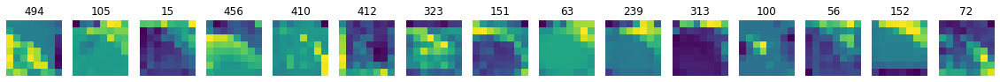

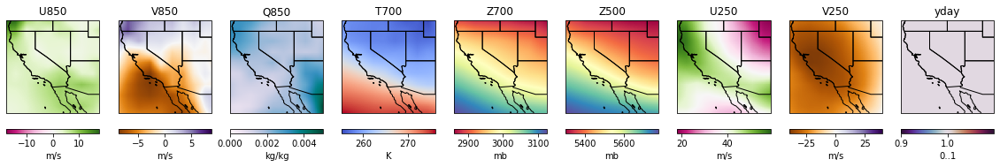

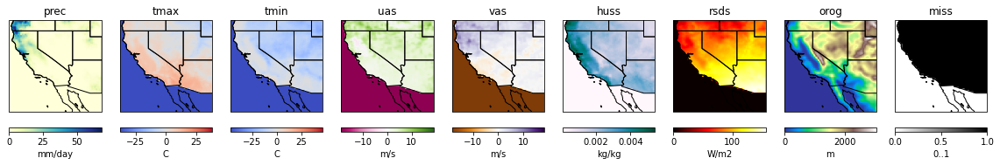

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


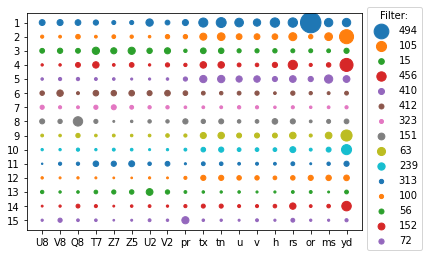

torch.Size([1, 512, 8, 8])


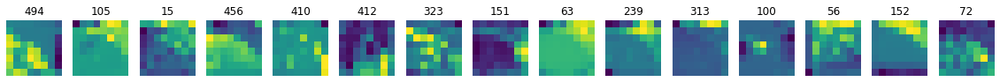

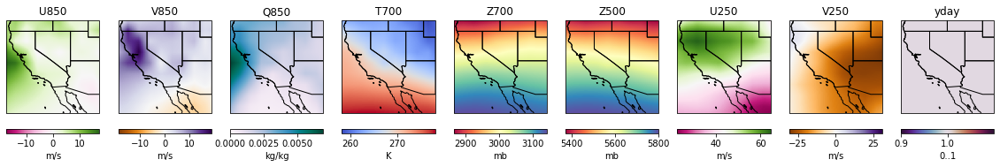

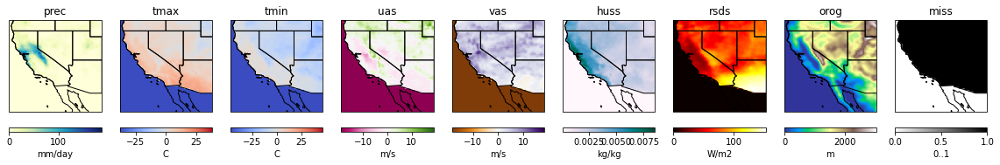

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


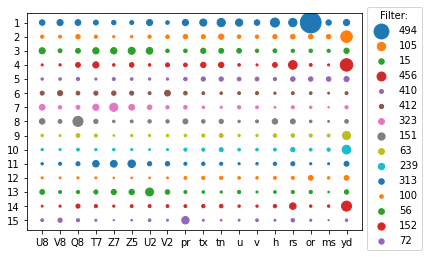

torch.Size([1, 512, 8, 8])


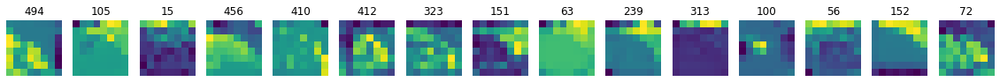

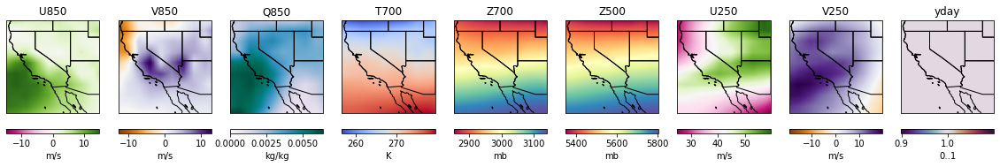

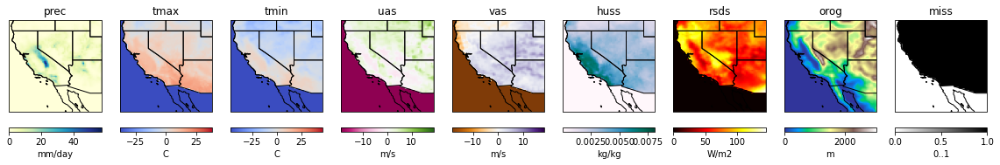

In [179]:
# storms indices: 7, 8, 9
# storm2 (January 3–5, 1982)
for ii in range(7,9+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


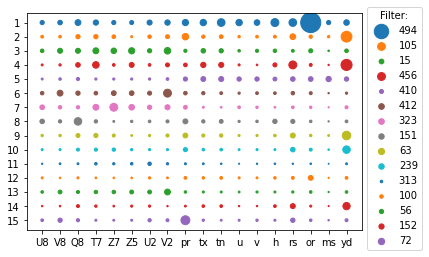

torch.Size([1, 512, 8, 8])


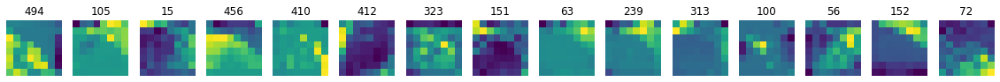

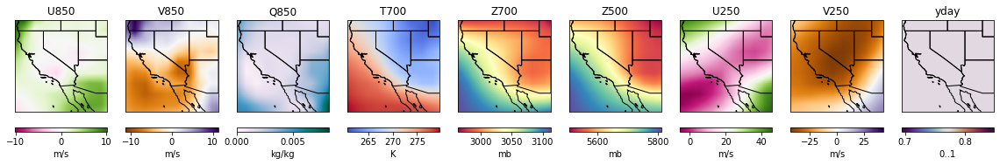

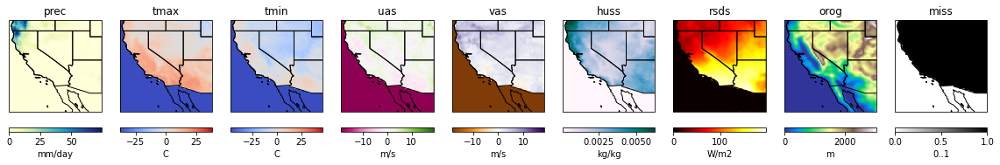

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


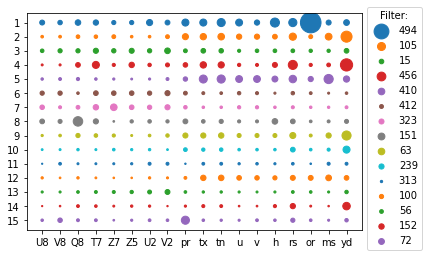

torch.Size([1, 512, 8, 8])


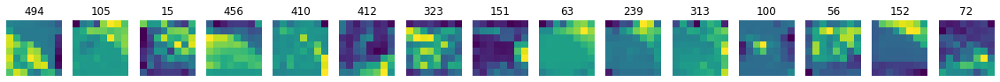

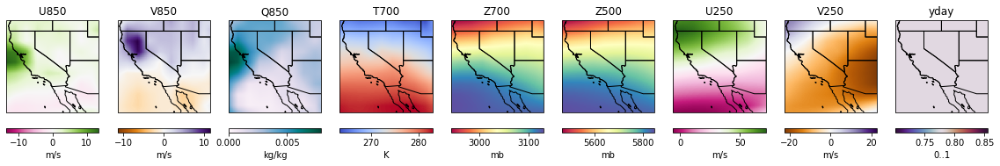

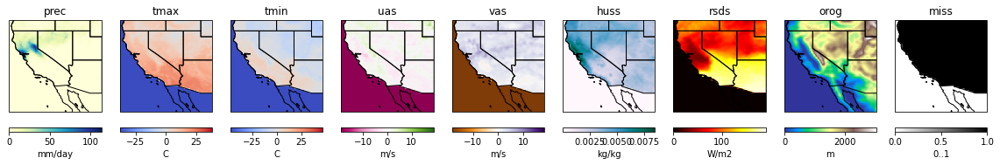

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


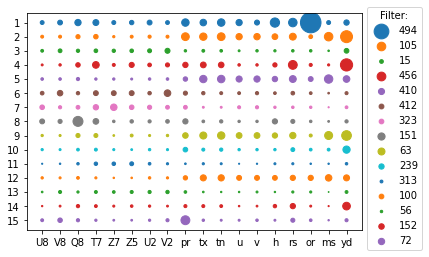

torch.Size([1, 512, 8, 8])


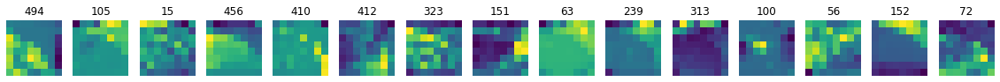

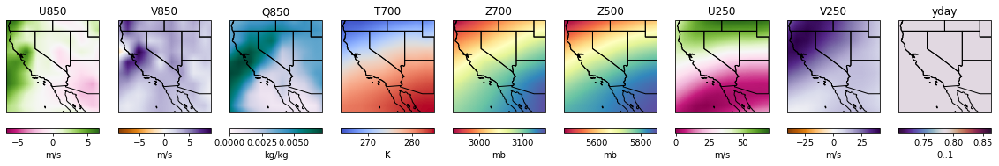

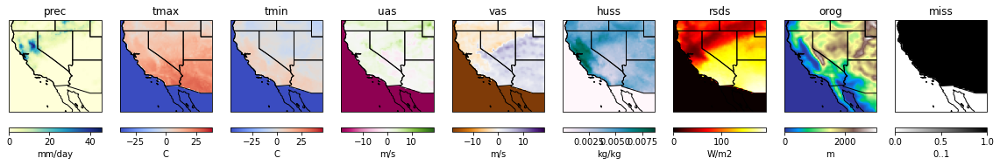

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


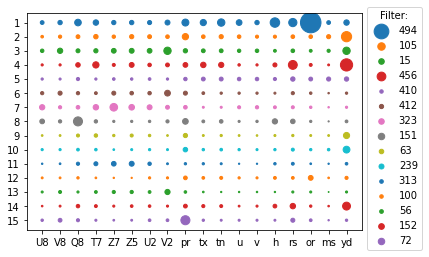

torch.Size([1, 512, 8, 8])


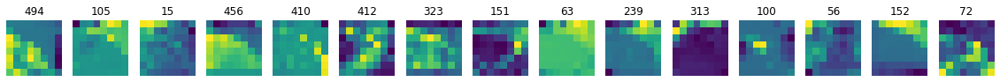

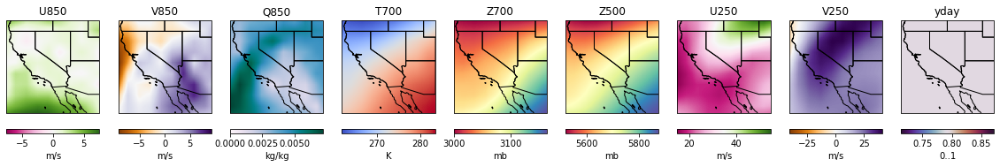

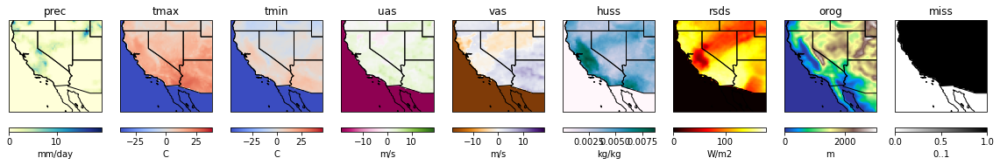

In [180]:
# storms indices: 10, 11, 12, 13
# storm3 (November 4–7, 1994)
for ii in range(10,13+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


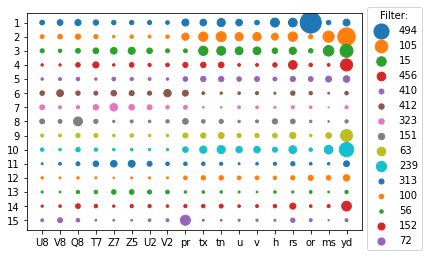

torch.Size([1, 512, 8, 8])


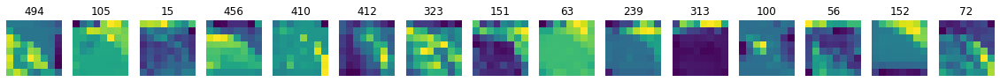

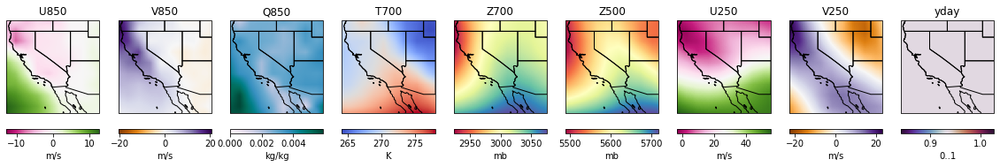

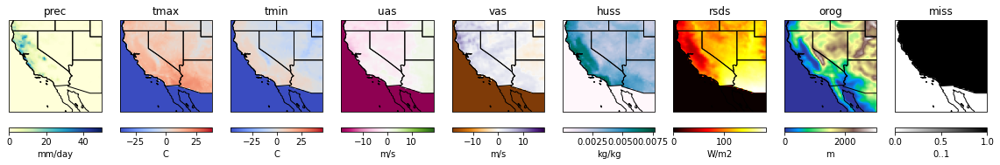

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


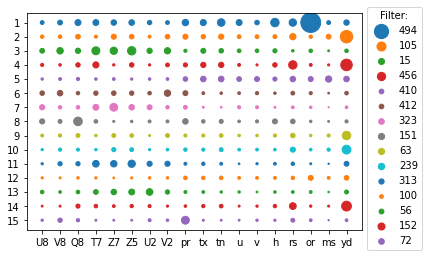

torch.Size([1, 512, 8, 8])


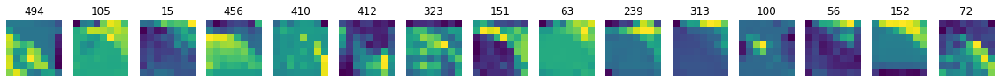

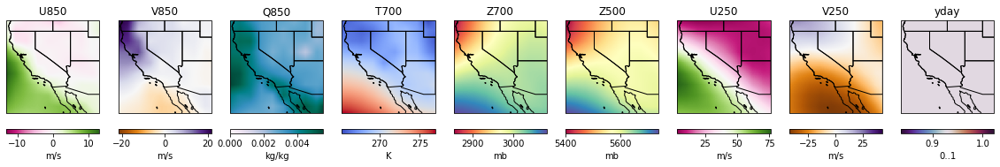

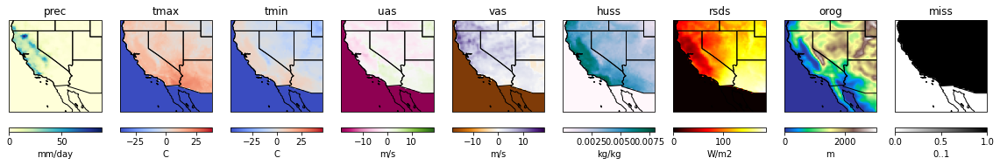

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


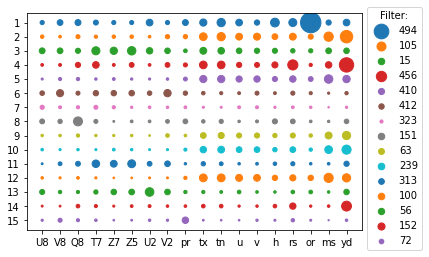

torch.Size([1, 512, 8, 8])


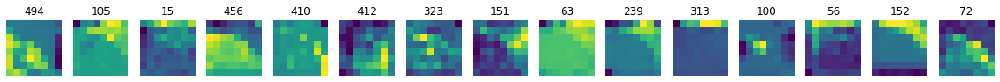

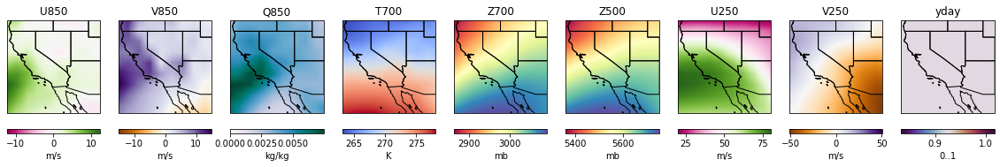

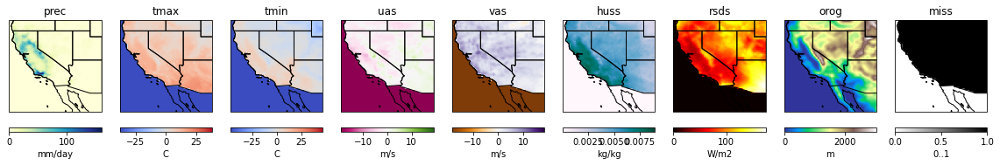

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


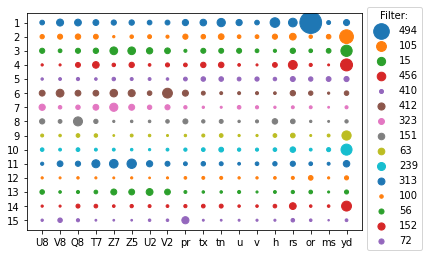

torch.Size([1, 512, 8, 8])


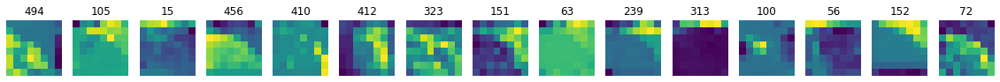

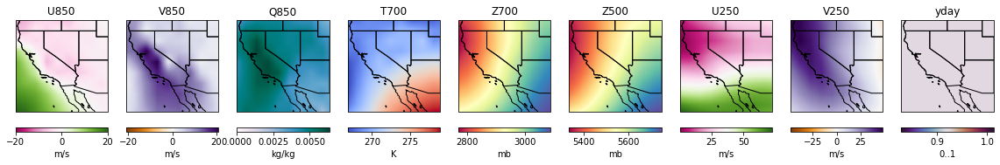

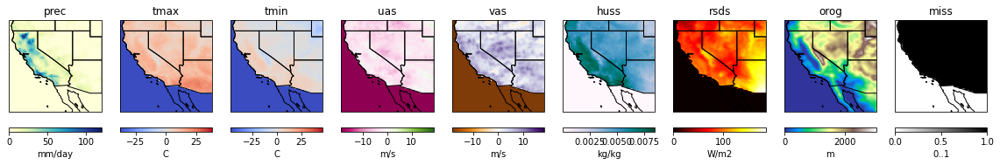

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


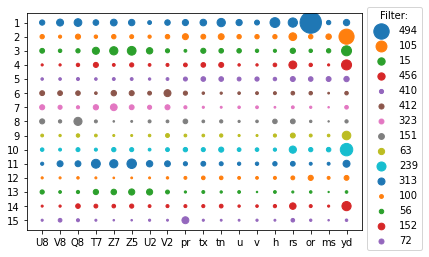

torch.Size([1, 512, 8, 8])


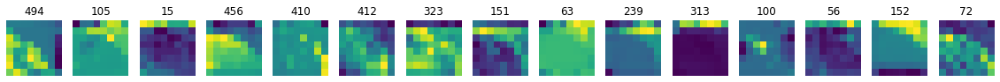

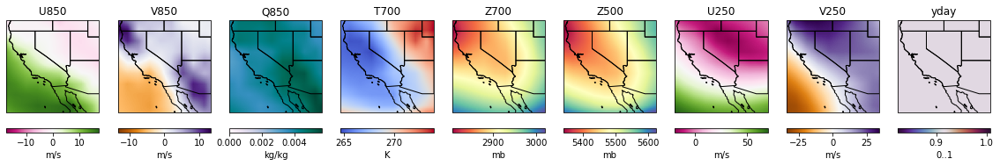

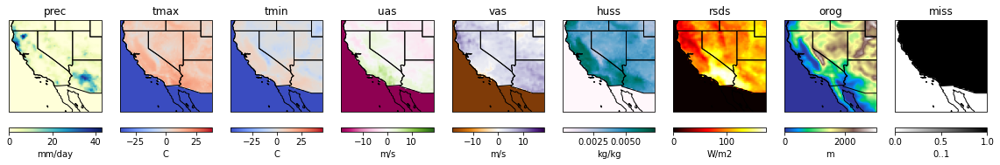

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


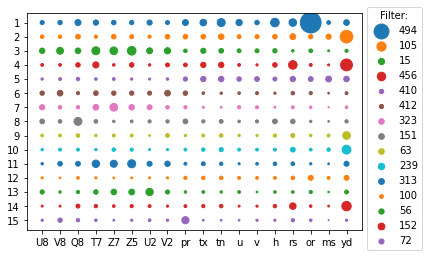

torch.Size([1, 512, 8, 8])


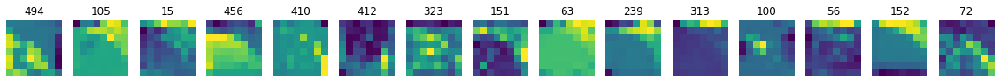

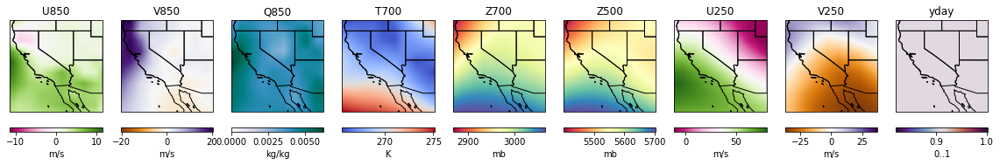

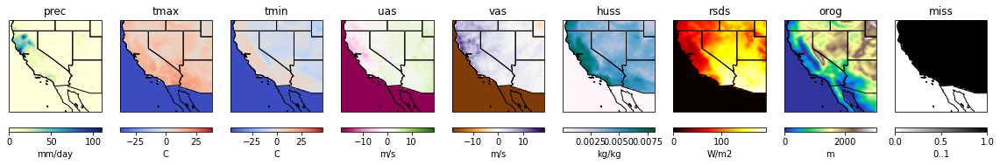

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


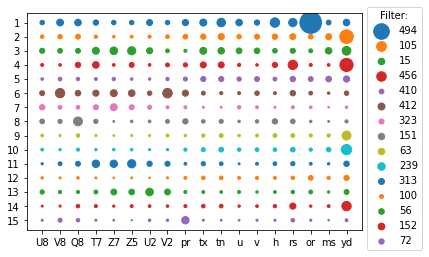

torch.Size([1, 512, 8, 8])


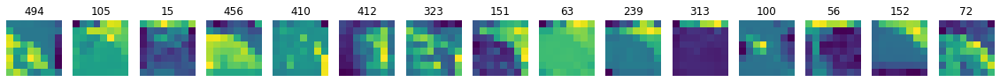

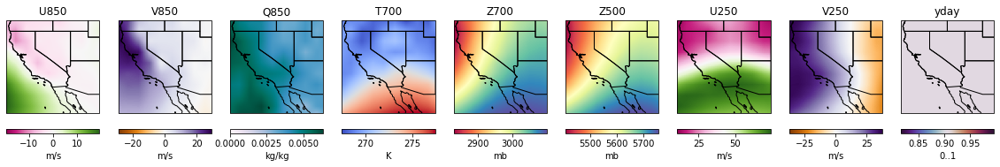

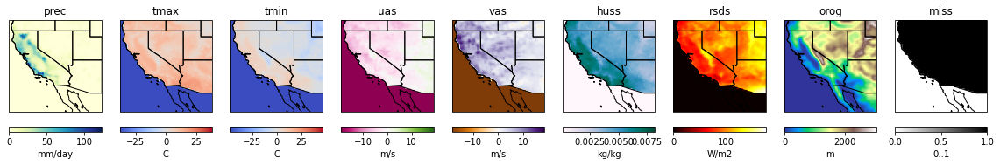

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


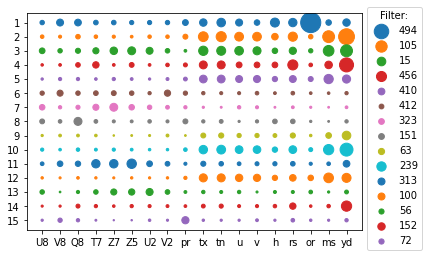

torch.Size([1, 512, 8, 8])


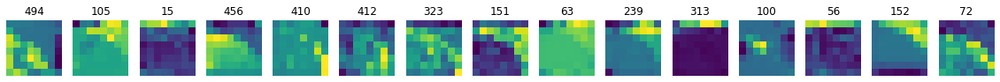

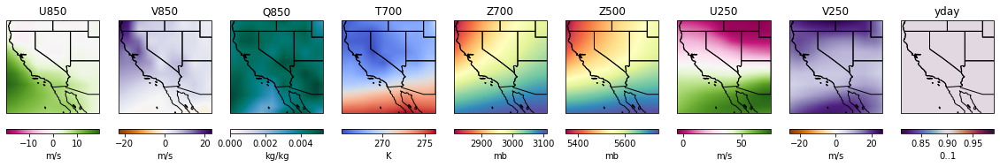

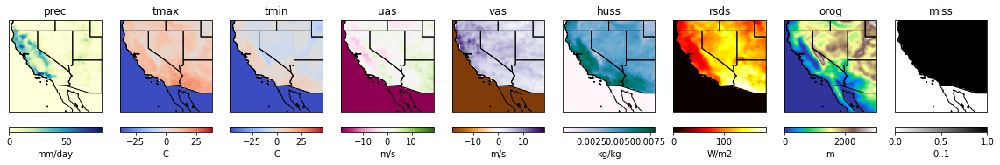

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


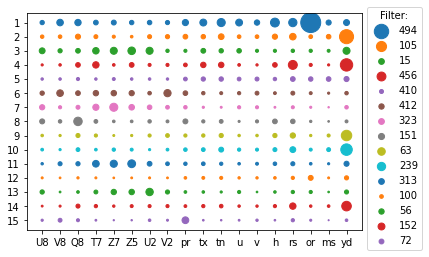

torch.Size([1, 512, 8, 8])


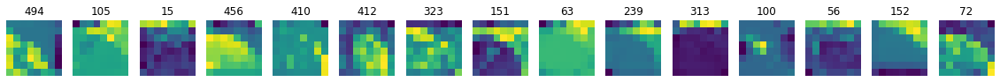

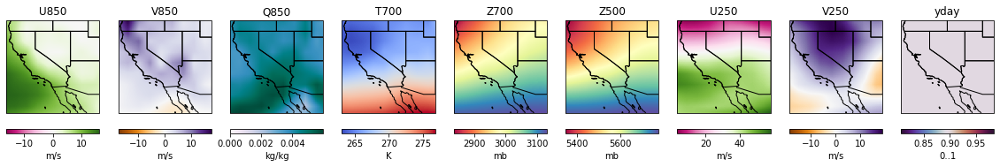

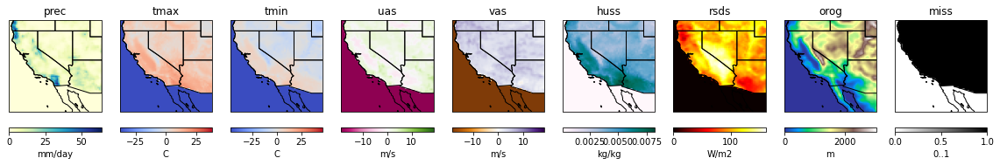

In [181]:
# storms indices: 14, 15, 16, 17, 18, 19, 20, 21, 22
# storm4 (January 31 - February 8, 1998)
for ii in range(14,22+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


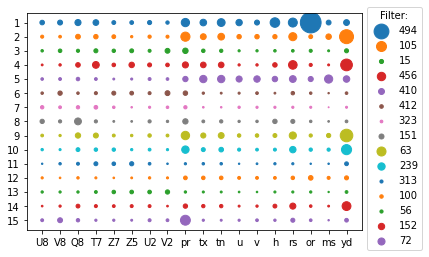

torch.Size([1, 512, 8, 8])


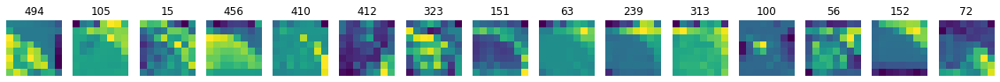

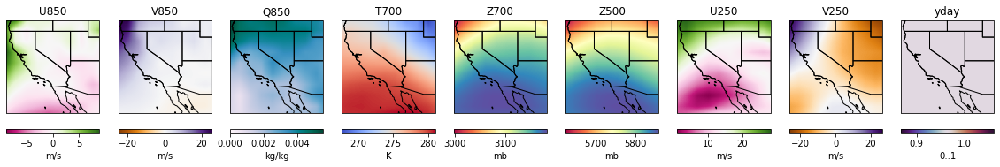

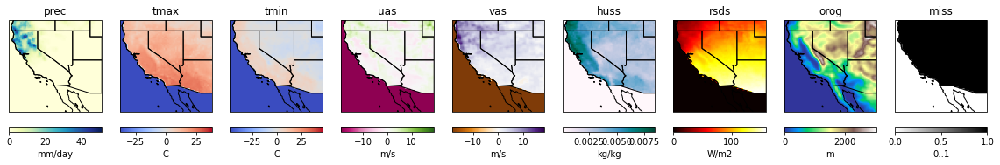

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


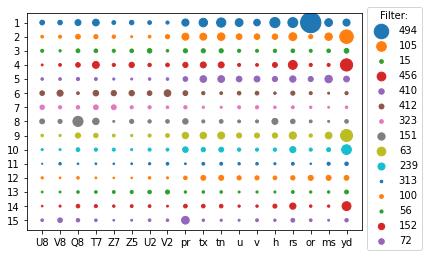

torch.Size([1, 512, 8, 8])


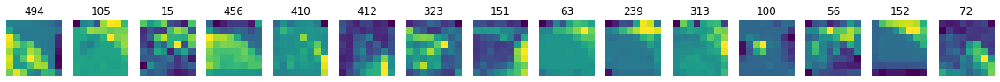

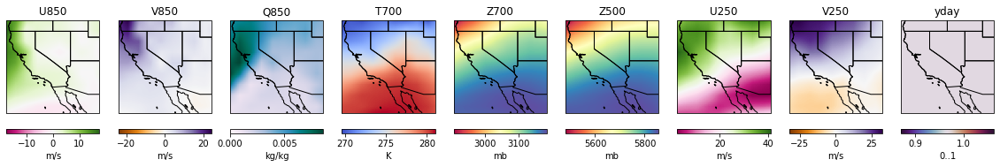

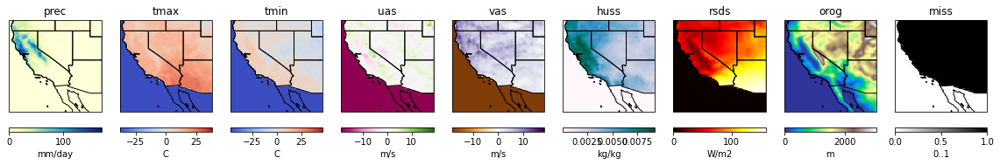

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


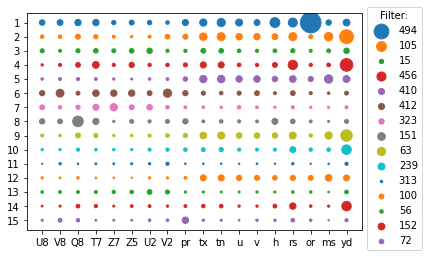

torch.Size([1, 512, 8, 8])


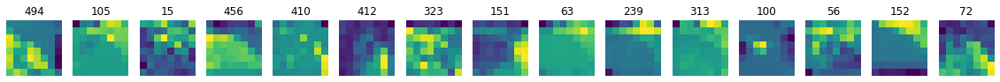

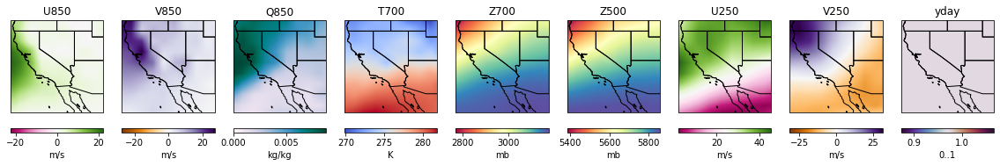

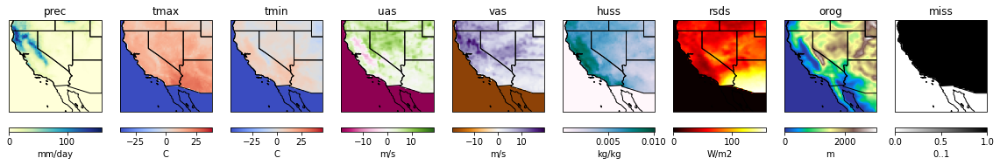

In [182]:
# storms indices: 23, 24, 25
# storm5 (December 10–13, 1995)
for ii in range(23,25+1):
    # ERA extreme day
    #input_chunk = storms[ii:ii+1, :, 58:58+64, 110:110+64]
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom
    err1_list_era, err2_list_era = calc_err_list(input_chunk, bn_mean_era, gen_b)
    
    
    # Plot
    bubble_plot(top15_filters_era, err1_list_era)
    
    plot_activation(top15_filters_era, input_chunk, bn_mean_era, gen_b)
    
    show_storm(ii)
